In [189]:
from scipy.io import loadmat
import keras
import os
# from google.colab import files, drive
from sklearn.cross_decomposition import PLSRegression

from tqdm import tqdm as tqdm #tqdm_notebook doesn't work
import matplotlib.pyplot as plt
import scipy as sc
import scipy.signal as ss
import numpy as np
import matplotlib.pyplot as plot
from math import sqrt
import pywt

Using TensorFlow backend.


In [2]:
#It's faster to load from google drive
#You have to add 'Прогнозирование намерений' to your google drive first(left click -> add to My drive)
# drive.mount('/content/drive')
root = '/home/sn0wbars/Downloads/BCICIV_4_mat'

In [18]:
mat = loadmat(os.path.join(root, "sub1_comp.mat"))

0 канал

In [139]:
train_data = np.array(mat['train_data'])[:100000,:]#!
train_dg = np.array(mat['train_dg'])[:100000,:]#!
test_data = np.array(mat['test_data'])
times, channels = train_data.shape
timesd, fingers = train_dg.shape

In [74]:
test = loadmat(os.path.join(root, "sub1_testlabels.mat"))
test = np.array(test['test_dg'])

FileNotFoundError: [Errno 2] No such file or directory: '/home/sn0wbars/Downloads/BCICIV_4_mat/sub1_testlabels.mat'

Не очень понятно, какие значения в widths помещать. Понятно, что чем больше, тем потенциално больше информации о колебаниях получим, но слишком накладно выйдет. Экспериментируем. [cwt](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.cwt.html#scipy.signal.cwt)
- Можно будет глянуть в статьях

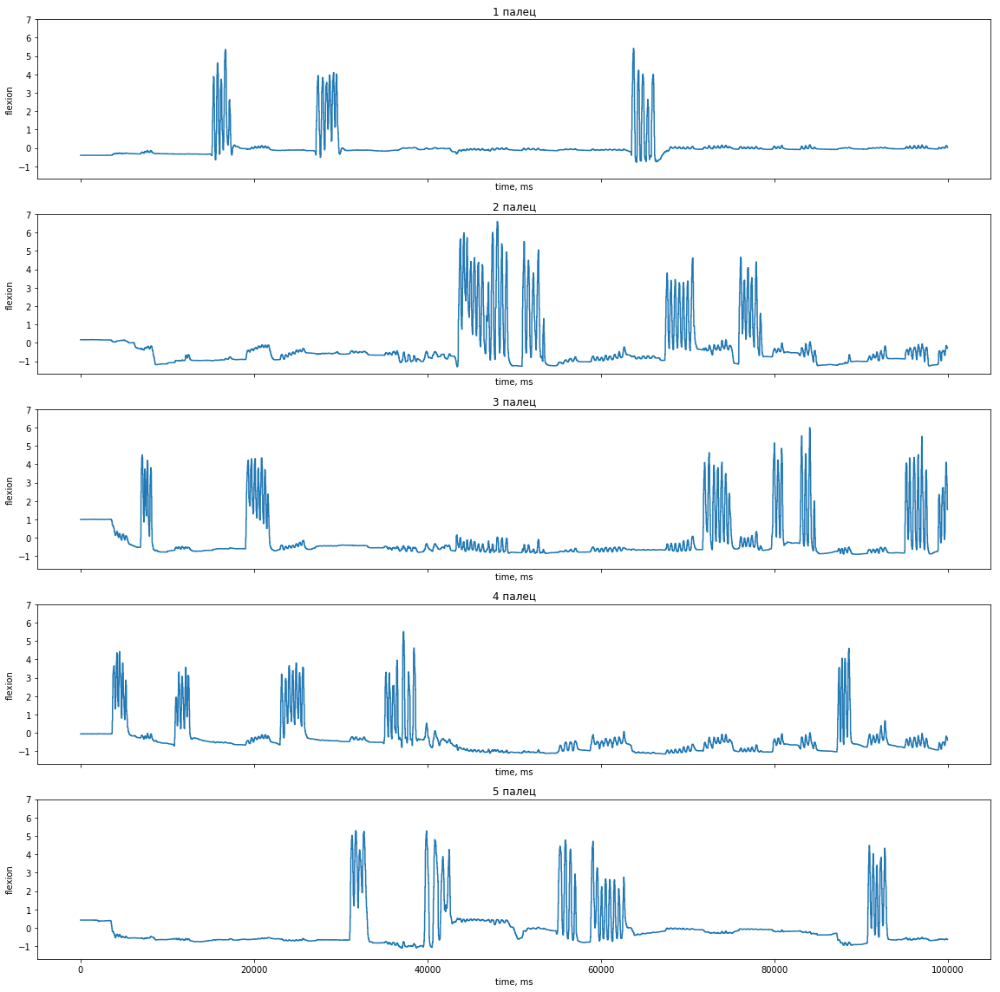

In [35]:
#Сгиб/разгиб пальцев демо
f, ax = plt.subplots(fingers, sharex=True, sharey=True, figsize=(16,16))
for fing in range(fingers):
    ax[fing].set_title('{} палец'.format(fing+1))
    ax[fing].set_xlabel('time, ms')
    ax[fing].set_ylabel('flexion')
    ax[fing].plot(train_dg[:,fing])
plt.tight_layout()

In [6]:
#less data
train_data = train_data[:10000, :]
train_dg = train_dg[:10000, :]

/home/sn0wbars/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


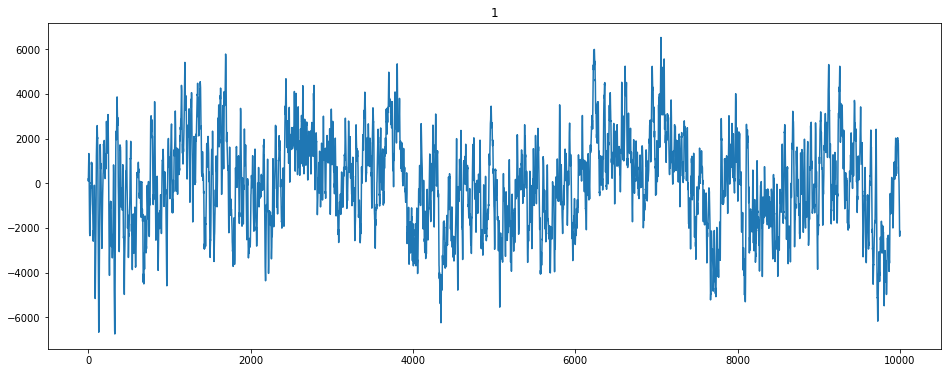

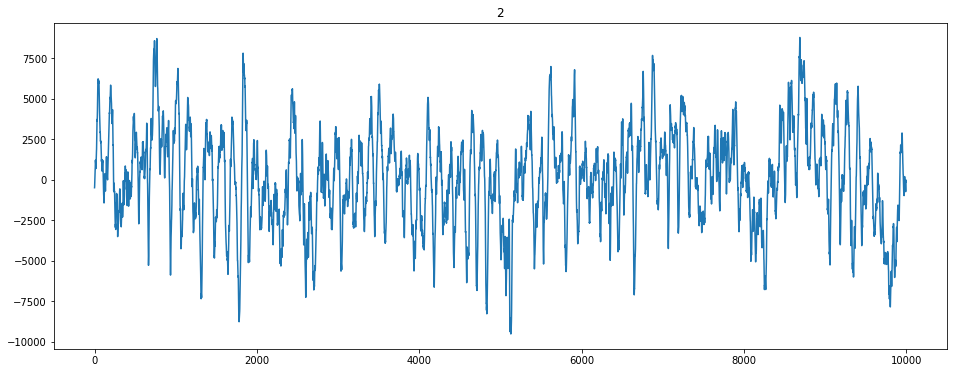

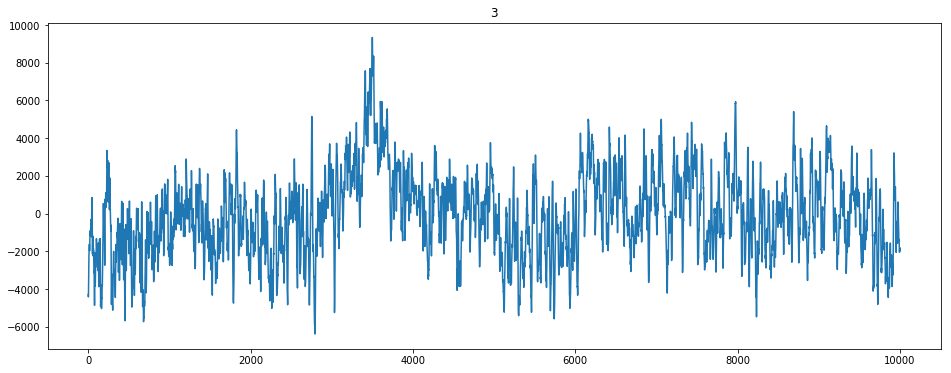

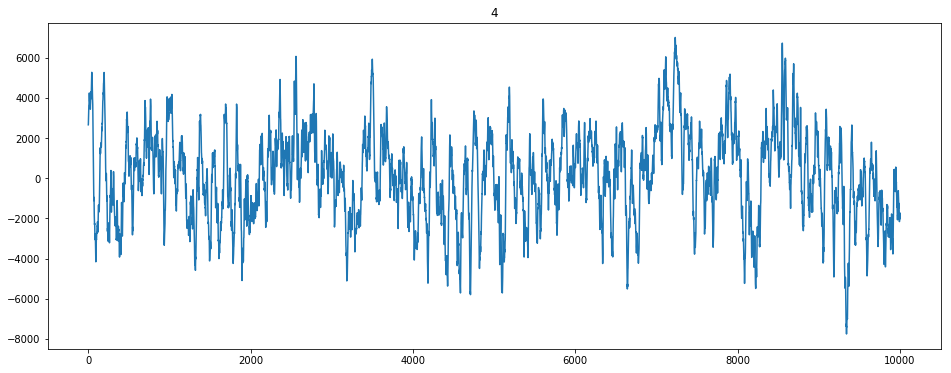

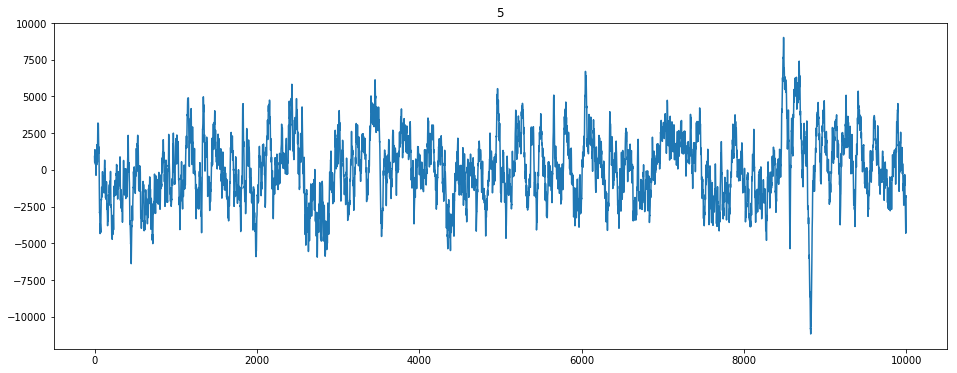

...

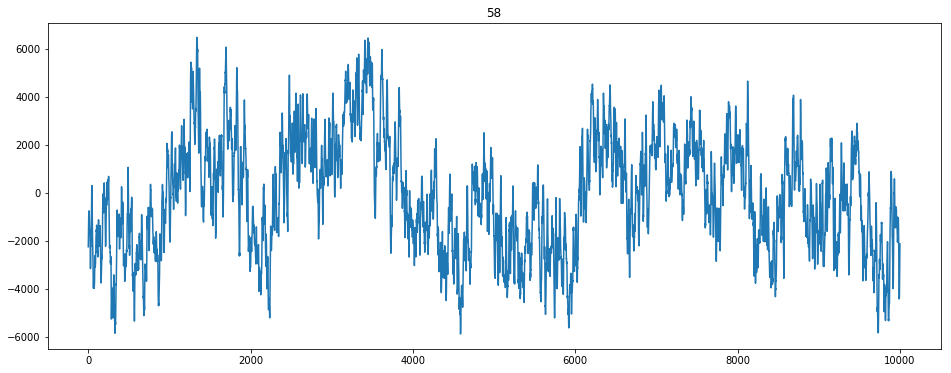

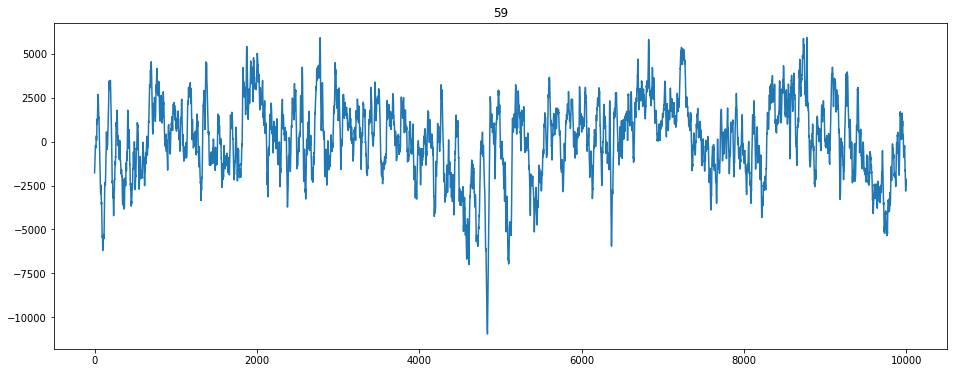

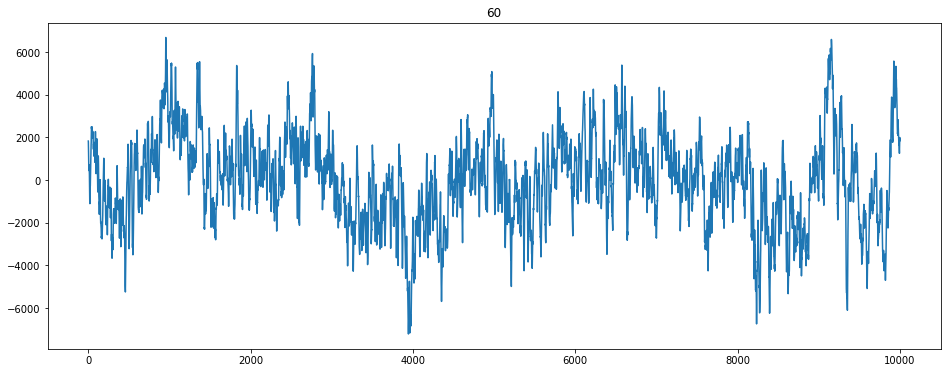

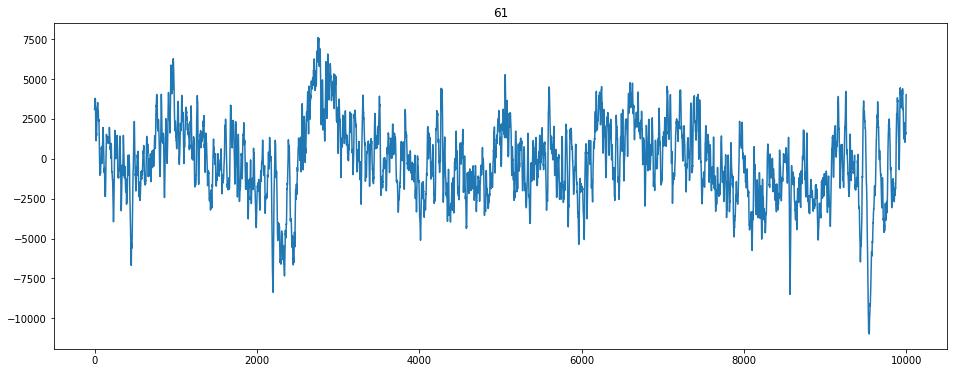

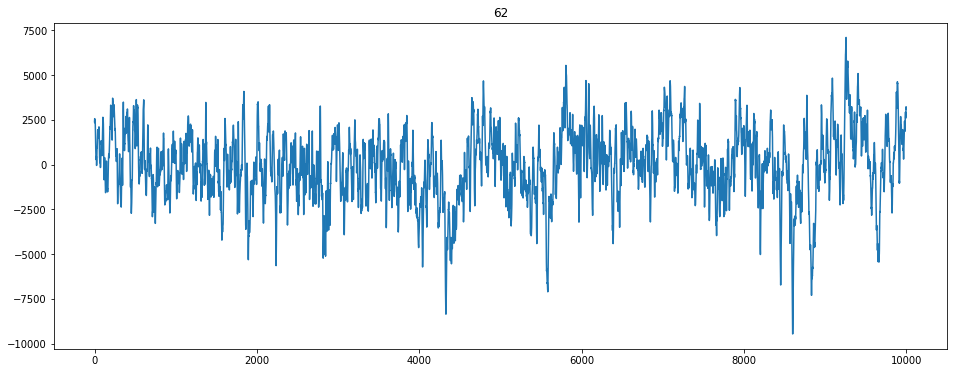

In [144]:
#frequences demo
for ch in range(channels):
  plt.figure(figsize=(16,6))
  plt.title(str(ch+1))
  plt.plot(train_data[:10000,ch])

# bandpass

In [116]:
from scipy.signal import butter, lfilter

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a


def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y


def signal_process(x):
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.signal import freqz

    # Sample rate and desired cutoff frequencies (in Hz).
    fs = 1000.0
    lowcut = 70
    highcut = 160

    return butter_bandpass_filter(x, lowcut, highcut, fs, order=6)

In [118]:
train_data2 = np.array([signal_process(train_data[:,ch]) for ch in range(channels)]).T
print(train_data2.shape)

(100000, 62)


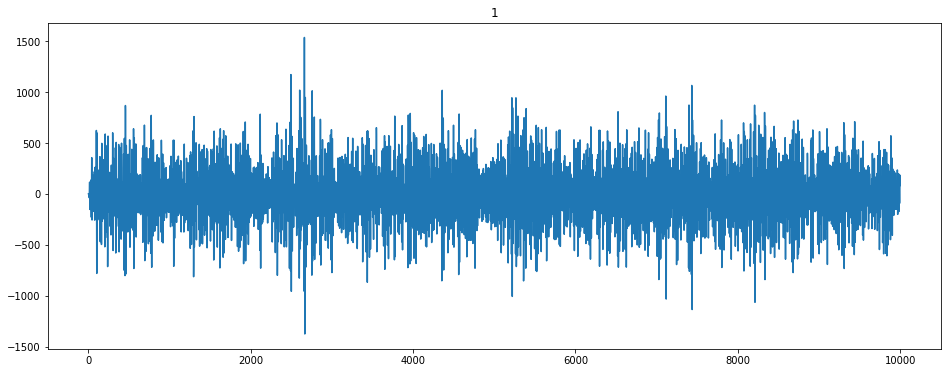

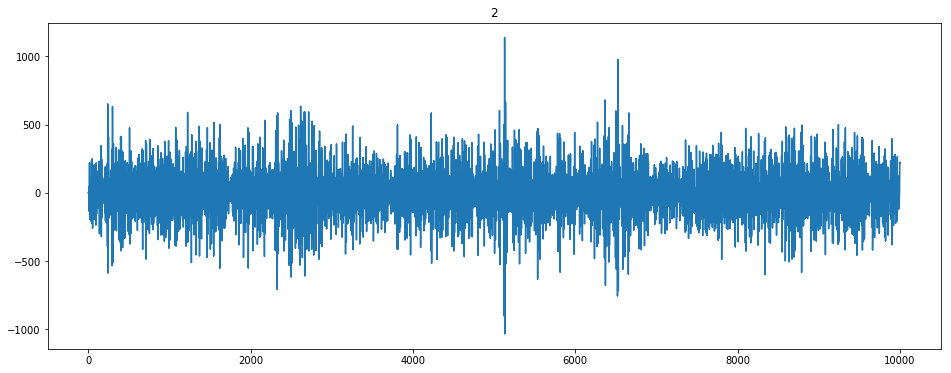

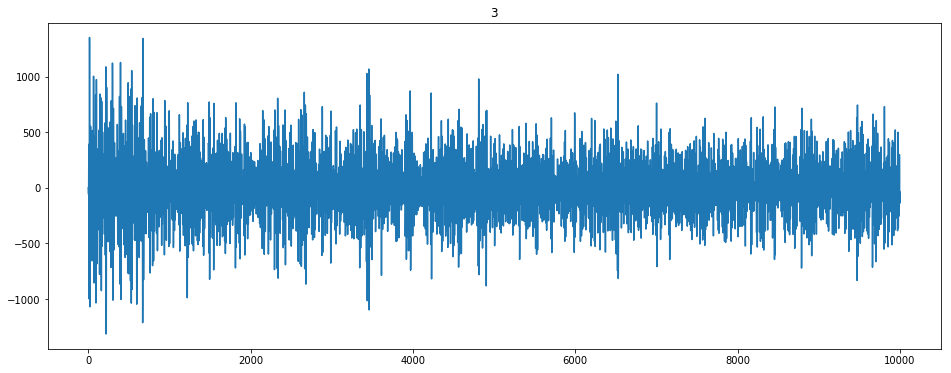

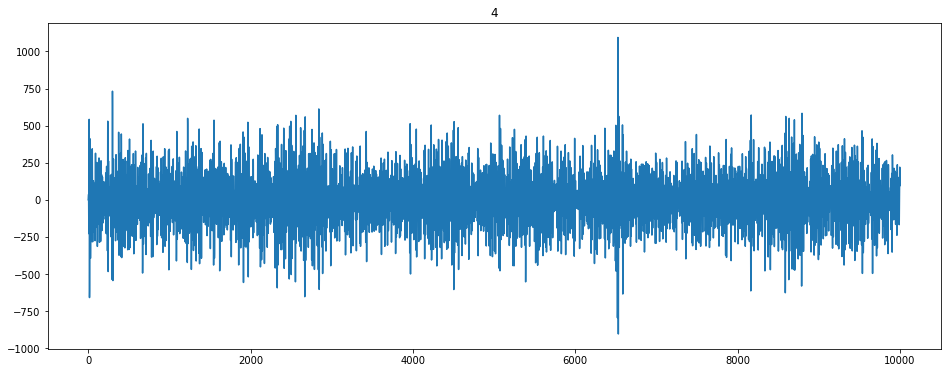

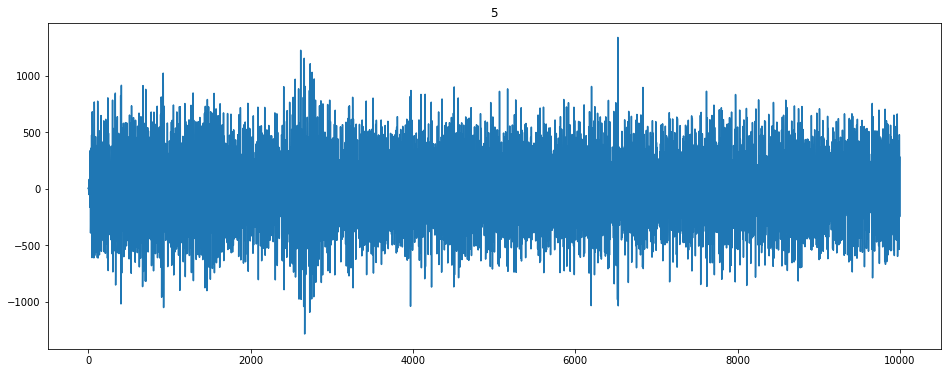

...

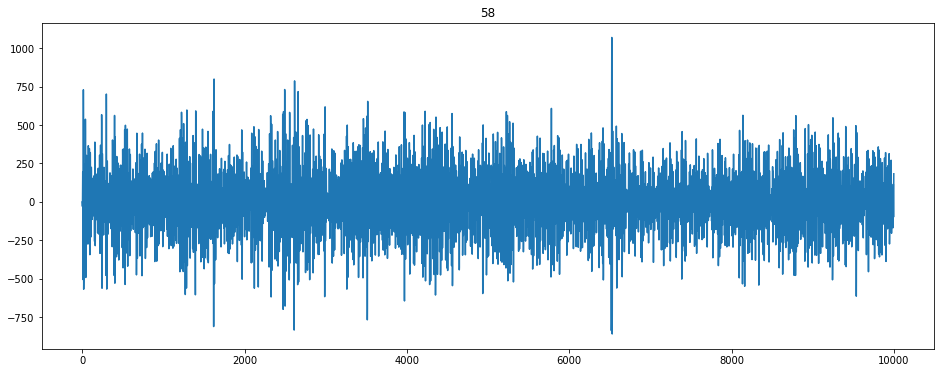

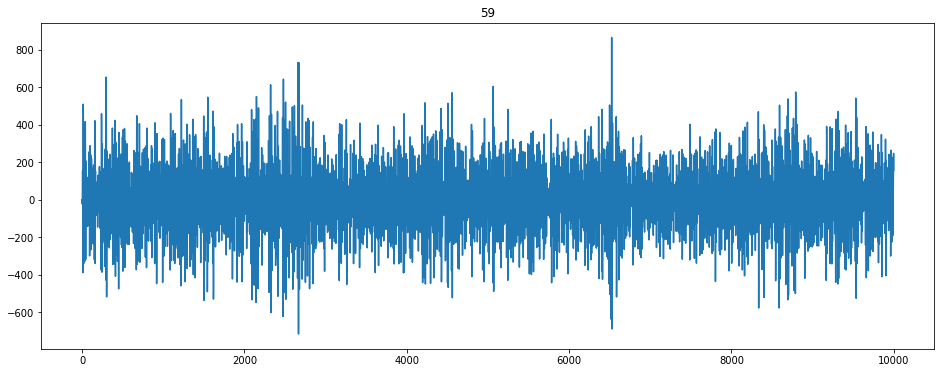

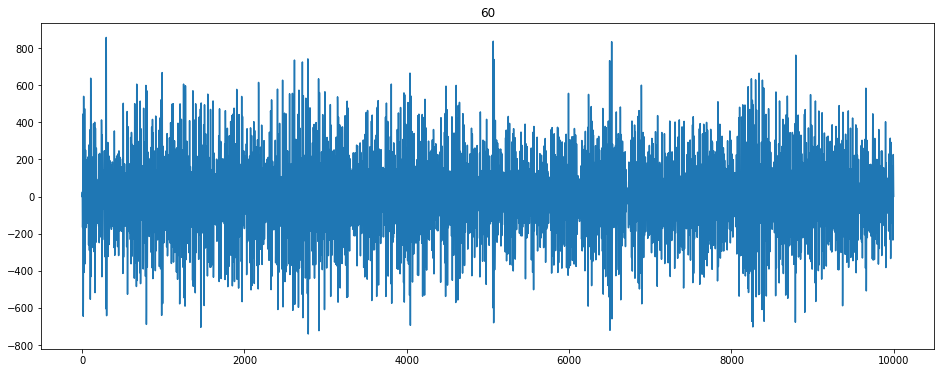

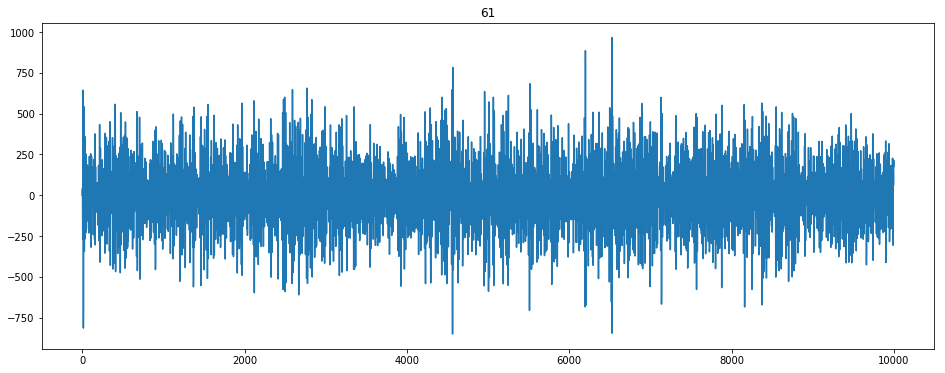

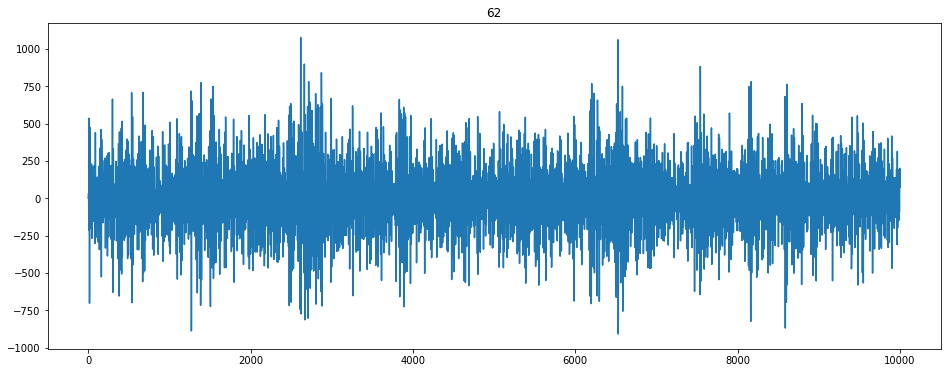

In [119]:
#frequences demo
for ch in range(channels):
  plt.figure(figsize=(16,6))
  plt.title(str(ch+1))
  plt.plot(train_data2[:10000, ch])

In [120]:
train_data=train_data2

# Wavelet

In [221]:
step = 10
scales =  np.array(range(10,40,4))
def gen_wavelet():
     #np.array(range(10,40,2))
    waveletFeatures = []
    for i in tqdm(range(channels)): #!
        wave = pywt.cwt(train_data[:,i], scales, 'morl', 0.001) #add scales
        waveletFeatures.append(np.array(wave[0][:,::step]))
    return waveletFeatures

In [222]:
gen_wavelet()
pass

100%|██████████| 62/62 [00:03<00:00, 18.83it/s]


In [223]:
w = waveletFeatures
print('Frequences (Hz)')
# print(w[0][1])
pywt.scale2frequency('morl', scales)*1000

Frequences (Hz)


array([81.25      , 58.03571429, 45.13888889, 36.93181818, 31.25      ,
       27.08333333, 23.89705882, 21.38157895])

(10, 10000)


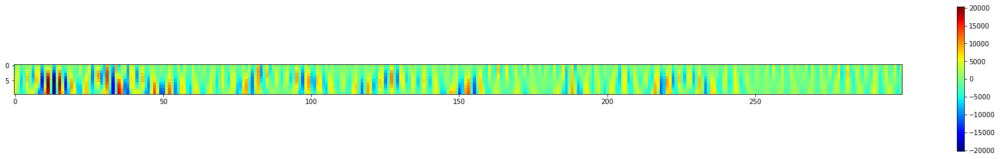

In [224]:
#demo wavelet
w = waveletFeatures[0]
print(waveletFeatures[0].shape)
x = w[:,:300]
max = abs(np.max(x))
plt.figure(figsize=(30,4))
plt.imshow(x, vmax=max, vmin=-max, cmap='jet')
plt.colorbar();

# PLS

In [225]:
dataset_size = 100000

In [226]:
train_data = np.array(mat['train_data'])[:dataset_size,:]#!
train_dg = np.array(mat['train_dg'])[:dataset_size,:]#!ize
waveletFeatures = gen_wavelet()
channel = 2
scalogram_size = len(scales)
pls2 = PLSRegression(n_components = 500)#number of components must be estimated
ex = np.array([x for x in waveletFeatures])
print(ex.shape)
print(len(train_dg[::4]), ex.shape[-1])
# for feature in (ex[:, :, i:i+scalogram_size] for i in range(ex.shape[-1]-scalogram_size)): # np.split(waveletFeatur
#     print(feature.shape)
X = np.array([feature.flatten() for feature
                    in (ex[:, :, i:i+scalogram_size] for i in range(ex.shape[-1]-scalogram_size))],dtype='float') # np.split(waveletFeatures[0][0], 10000, axis=1)])
# X=X[:len(X)//2]
Y = train_dg[::step,channel] #step
Y = Y[scalogram_size:]
# Y = Y[scalogram_size:(len(Y)+scalogram_size)//2]
print(X.shape, Y.shape)
pls2.fit(X, Y)
res = pls2.predict(X)
# plt.plot(res[:10000], 'r', train_dg[scalogram_size:10000,channel], 'b')

100%|██████████| 62/62 [00:03<00:00, 19.43it/s]


(62, 8, 10000)
25000 10000
(9992, 3968) (9992,)


In [34]:

# channel = 2
# scalogram_size = len(scales)
# pls2 = PLSRegression(n_components = 500)#number of components must be estimated
# ex = np.array(waveletFeatures)
# print(ex.shape)
# X = np.array([sc.stats.zscore(feature, axis=1, ddof=1).flatten() for feature
#                     in (ex[:, :, i:i+scalogram_size] for i in range(ex.shape[-1]-scalogram_size))],dtype='float') # np.split(waveletFeatures[0][0], 10000, axis=1)])
# Y = train_dg[scalogram_size:,channel] #step
# print(X.shape, Y.shape)
# pls2.fit(X, Y)
# res = pls2.predict(X)
# plt.plot(res[:10000], 'r', train_dg[:10000,channel], 'b')

(62, 15, 10000)
(9985, 13950) (99985,)


ValueError: Found input variables with inconsistent numbers of samples: [9985, 99985]

100%|██████████| 62/62 [00:04<00:00, 15.33it/s]


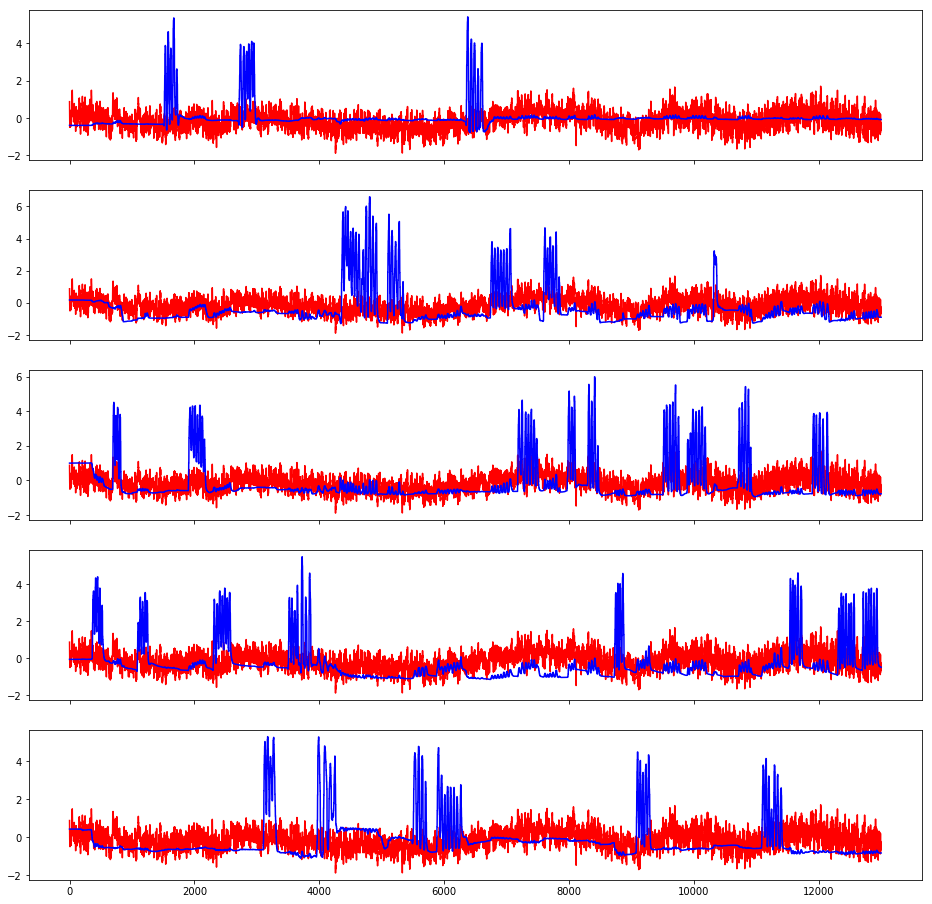

In [228]:
increase = 30000
train_data = np.array(mat['train_data'])[:dataset_size+increase,:]#!
train_dg = np.array(mat['train_dg'])[:dataset_size+increase,:]#!
waveletFeatures = gen_wavelet()
ex = np.array(waveletFeatures)
X = np.array([feature.flatten() for feature
                    in (ex[:, :, i:i+scalogram_size] for i in range(ex.shape[-1]-scalogram_size))],dtype='float') # np.split(waveletFeatures[0][0], 10000, axis=1)])
f, ax = plt.subplots(5, sharex=True, figsize=(16,16))
for i in range(len(ax)):
    ax[i].plot(pls2.predict(X), 'r', train_dg[::step,i], 'b')

In [0]:
[res[10-i:-1-i].shape for i in range(0,11)]

[(9980, 1),
 (9980, 1),
 (9980, 1),
 (9980, 1),
 (9980, 1),
 (9980, 1),
 (9980, 1),
 (9980, 1),
 (9980, 1),
 (9980, 1),
 (9980, 1)]

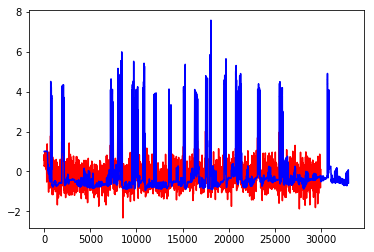

In [67]:
f,x = plt.plot(1/11*sum(res[10-i:-1-i] for i in range(0,11)), 'r', train_dg[5:-5:10,2], 'b')
plt.savefig('1.eps')

In [0]:
!cp 1.eps drive/My\ Drive/

In [56]:
!ls

1.eps  drive  sample_data


In [0]:
from sklearn.feature_selection import RFE
from sklearn.cross_decomposition import CCA

In [0]:
decomp = CCA(n_components = 25)#n_components=?
selector = RFE(decomp)# n_features_to_select=?
selector.fit(train_data[:,:], train_dg[:, 0])

NameError: ignored

In [0]:
res = selector.predict(test_data[:50000,:])

In [0]:
lossFunction(test[:50000, 0], res)

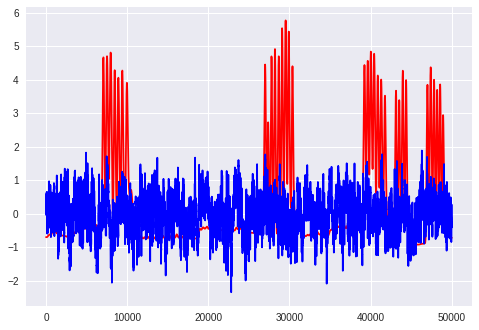

In [0]:
plt.plot(test[:50000, 0], 'r', res, 'b')

In [0]:
def lossFunction(x, y):
    loss = 0
    for i in range(len(x)):
        loss += pow(x[i] - y[i], 2)
    return sqrt(loss)

In [190]:
print(x.shape)

(5, 300)
